In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
%matplotlib inline 



In [6]:
# Waste Generation Dataset
waste_df = pd.read_csv('Bintix_GIS_Monthly_Dry_Waste_Kgs_Apr2024_Mar2025.csv')

# Participation Dataset
participation_df = pd.read_csv("Bintix_GIS_With_Participation %.csv")


In [7]:
waste_df.head()

,City,Community ID,Pincode,Latitude,Longitude,April 2024,May 2024,June 2024,July 2024,August 2024,September 2024,October 2024,November 2024,December 2024,January 2025,February 2025,March 2025
0,Hyderabad,C100,500001,17.365659,78.476015,80,78,43,62,84,56,99,57,41,62,116,52
1,Hyderabad,C101,500001,17.367778,78.493744,47,44,67,111,113,75,111,80,103,78,105,45
2,Hyderabad,C102,500001,17.403548,78.494220,112,72,54,55,79,51,55,78,62,117,44,73
3,Hyderabad,C103,500001,17.366147,78.480518,64,53,50,50,94,80,114,99,62,101,54,97
4,Hyderabad,C104,500001,17.387360,78.484502,61,43,42,61,120,70,87,106,82,75,117,63


In [8]:
participation_df.head()

,City,Pincode,Latitude,Longitude,Participation (%)
0,Hyderabad,500001,17.353720,78.472077,57.3
1,Hyderabad,500001,17.413109,78.537675,37.3
2,Hyderabad,500001,17.414054,78.461319,40.3
3,Hyderabad,500001,17.388867,78.469946,44.1
4,Hyderabad,500001,17.396669,78.441645,42.0


In [12]:
#checking for null values
print(waste_df.isnull().sum(),participation_df.isnull().sum())

City              0
Community ID      0
Pincode           0
Latitude          0
Longitude         0
April 2024        0
May 2024          0
June 2024         0
July 2024         0
August 2024       0
September 2024    0
October 2024      0
November 2024     0
December 2024     0
January 2025      0
February 2025     0
March 2025        0
dtype: int64 City                 0
Pincode              0
Latitude             0
Longitude            0
Participation (%)    0
dtype: int64


In [21]:

monthly_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]

# Sum across these months
waste_df['Total_Waste'] = waste_df[monthly_cols].sum(axis=1)
waste_df['Total_Waste'].sum()





2011796

In [23]:
city_waste = waste_df.groupby('City')['Total_Waste'].sum().reset_index()
city_waste

,City,Total_Waste
0,Bangalore,288119
1,Chennai,288034
2,Delhi,286667
3,Hyderabad,287212
4,Kolkata,287172
5,Mumbai,287777
6,Pune,286815


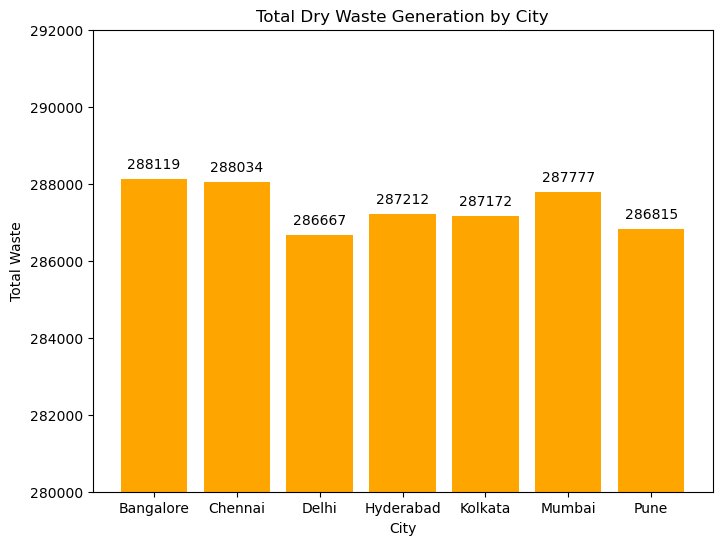

In [26]:
plt.figure(figsize=(8, 6))
bars = plt.bar(city_waste['City'], city_waste['Total_Waste'], color='orange')
plt.title('Total Dry Waste Generation by City')
plt.ylabel('Total Waste')
plt.xlabel('City')

# Set custom y-axis limits (adjust based on your actual data)
plt.ylim(280000, 292000)

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 200, f'{int(yval)}', ha='center', va='bottom')

plt.show()


In [29]:
# List of monthly columns
monthly_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]

# Group by city and sum for each month
city_monthly = waste_df.groupby('City')[monthly_cols].sum()

# Check the table
print(city_monthly.head())



           April 2024  May 2024  June 2024  July 2024  August 2024  \
City                                                                 
Bangalore       24542     23841      24304      23694        23850   
Chennai         23548     24227      24389      23519        23874   
Delhi           24360     23549      23280      23872        23928   
Hyderabad       23761     23579      22892      23760        24047   
Kolkata         24047     24197      23536      23391        24140   

           September 2024  October 2024  November 2024  December 2024  \
City                                                                    
Bangalore           23743         24082          23689          23602   
Chennai             24460         23903          24115          24162   
Delhi               24360         23836          23955          23855   
Hyderabad           23860         24237          24079          24303   
Kolkata             24178         23865          23778          23683  

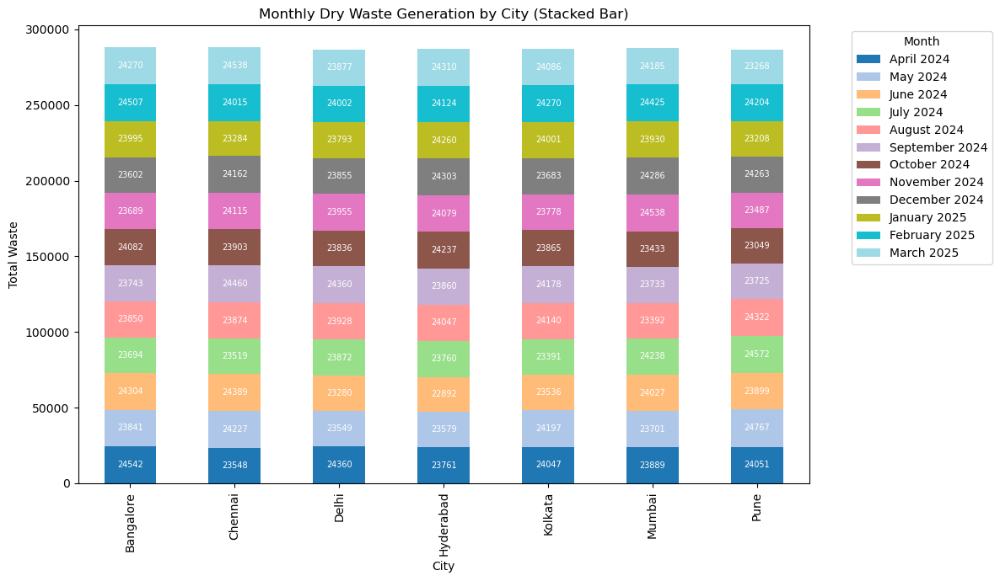

In [32]:
# Group by city and sum for each month (already done)
city_monthly = waste_df.groupby('City')[monthly_cols].sum()

# Plot
ax = city_monthly.plot(kind='bar', stacked=True, figsize=(12, 7), colormap='tab20')

plt.title('Monthly Dry Waste Generation by City (Stacked Bar)')
plt.ylabel('Total Waste')
plt.xlabel('City')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')

# Get bar positions
bar_positions = np.arange(len(city_monthly))

# Loop through each month to add text
cumulative_values = np.zeros(len(city_monthly))  # To track where to stack

for month in monthly_cols:
    month_values = city_monthly[month].values

    for i, (value, cum) in enumerate(zip(month_values, cumulative_values)):
        if value > 0:
            plt.text(i, cum + value / 2, str(int(value)), ha='center', va='center', fontsize=7, color='white')

    cumulative_values += month_values  # Update cumulative height

plt.tight_layout()
plt.show()

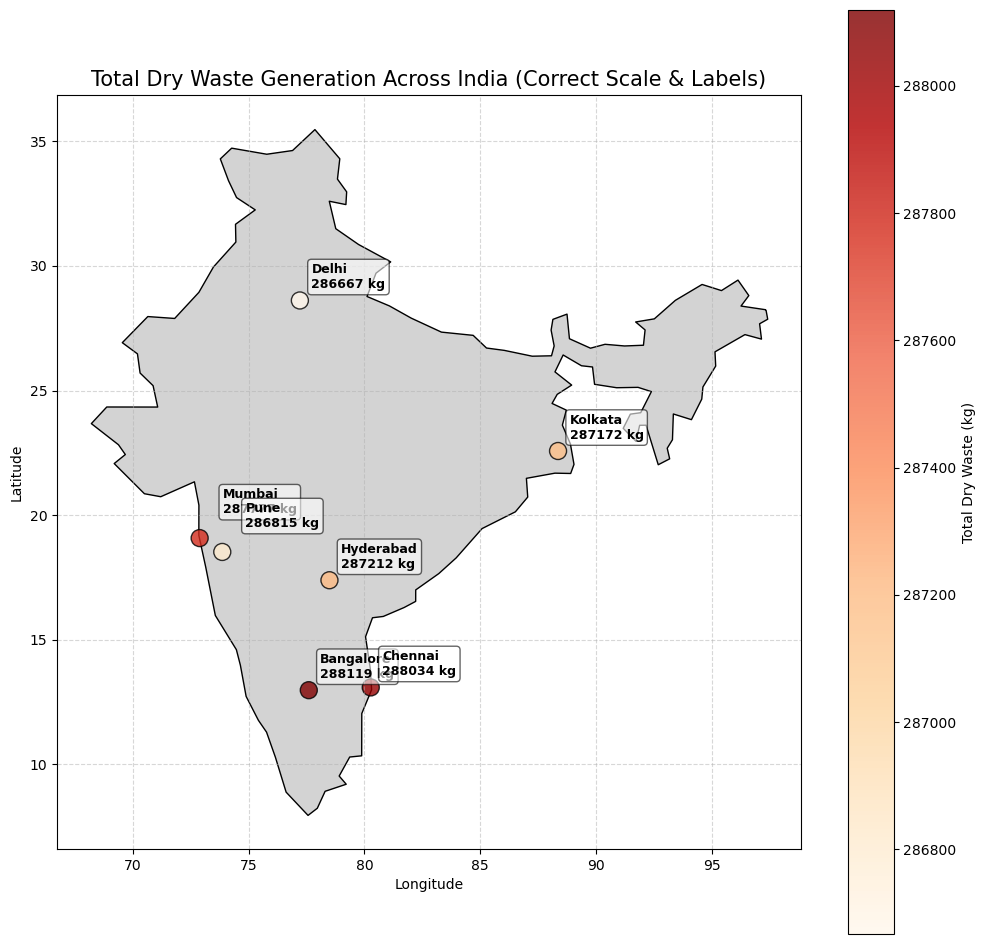

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Read shapefile directly from zip
world = gpd.read_file(r'ne_110m_admin_0_countries.zip')

# Filter for India
india = world[world['NAME'] == 'India']

# Prepare Waste GeoDataFrame
waste_df['geometry'] = waste_df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)
waste_gdf = gpd.GeoDataFrame(waste_df, geometry='geometry')
waste_gdf.set_crs(epsg=4326, inplace=True)

# Group by City to get total waste and coordinates for label placement
city_waste = waste_gdf.groupby('City').agg({
    'Total_Waste': 'sum',
    'Longitude': 'mean',
    'Latitude': 'mean'
}).reset_index()

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
india.plot(ax=ax, color='lightgrey', edgecolor='black')

# Use Total_Waste from city_waste for correct color scale
sc = ax.scatter(city_waste['Longitude'], city_waste['Latitude'], 
                c=city_waste['Total_Waste'], cmap='OrRd', s=150, edgecolor='black', alpha=0.8)

# Add colorbar with correct range
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Total Dry Waste (kg)')

# Add labels with minor shifts to avoid overlap
for idx, row in city_waste.iterrows():
    x_shift = 1 if row['City'] in ['Mumbai', 'Pune'] else 0.5
    y_shift = 1 if row['City'] in ['Mumbai', 'Pune'] else 0.5
    
    plt.text(row['Longitude'] + x_shift, 
             row['Latitude'] + y_shift, 
             f"{row['City']}\n{int(row['Total_Waste'])} kg", 
             fontsize=9, color='black', weight='bold',
             bbox=dict(facecolor='white', alpha=0.6, boxstyle='round,pad=0.3'))

plt.title('Total Dry Waste Generation Across India', fontsize=15)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


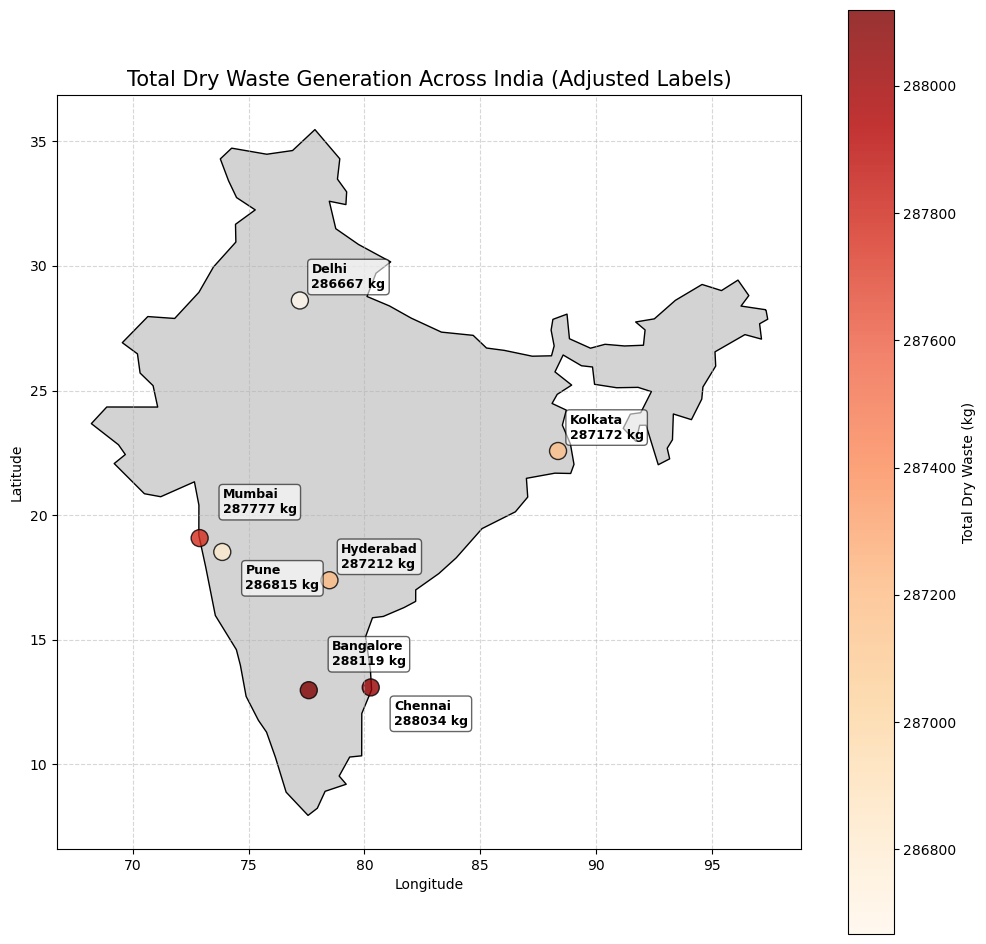

In [43]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Read shapefile directly from zip
world = gpd.read_file(r'ne_110m_admin_0_countries.zip')

# Filter for India
india = world[world['NAME'] == 'India']

# Prepare Waste GeoDataFrame
waste_df['geometry'] = waste_df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)
waste_gdf = gpd.GeoDataFrame(waste_df, geometry='geometry')
waste_gdf.set_crs(epsg=4326, inplace=True)

# Group by City to get total waste and coordinates for label placement
city_waste = waste_gdf.groupby('City').agg({
    'Total_Waste': 'sum',
    'Longitude': 'mean',
    'Latitude': 'mean'
}).reset_index()

# Custom offsets per city to avoid overlap
offsets = {
    'Mumbai': (1, 1),
    'Pune': (1, -1.5),
    'Bangalore': (1, 1),
    'Chennai': (1, -1.5),
    'Hyderabad': (0.5, 0.5),
    'Delhi': (0.5, 0.5),
    'Kolkata': (0.5, 0.5)
}

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
india.plot(ax=ax, color='lightgrey', edgecolor='black')

# Scatter with correct color scale
sc = ax.scatter(city_waste['Longitude'], city_waste['Latitude'], 
                c=city_waste['Total_Waste'], cmap='OrRd', s=150, edgecolor='black', alpha=0.8)

# Colorbar
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Total Dry Waste (kg)')

# Labels with custom offsets
for idx, row in city_waste.iterrows():
    x_shift, y_shift = offsets.get(row['City'], (0.5, 0.5))
    
    plt.text(row['Longitude'] + x_shift, 
             row['Latitude'] + y_shift, 
             f"{row['City']}\n{int(row['Total_Waste'])} kg", 
             fontsize=9, color='black', weight='bold',
             bbox=dict(facecolor='white', alpha=0.6, boxstyle='round,pad=0.3'))

plt.title('Total Dry Waste Generation Across India (Adjusted Labels)', fontsize=15)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [45]:
import folium


# Your City Waste Data
city_waste = pd.DataFrame({
    'City': ['Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai', 'Pune'],
    'Latitude': [12.97, 13.08, 28.61, 17.38, 22.57, 19.07, 18.52],
    'Longitude': [77.59, 80.27, 77.20, 78.48, 88.36, 72.88, 73.86],
    'Total_Waste': [288119, 288034, 286667, 287212, 287172, 287777, 286815]
})

# Initialize Map centered over India
m = folium.Map(location=[22.0, 78.0], zoom_start=5)

# Add Markers for Each City
for idx, row in city_waste.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=10,
        color='red',
        fill=True,
        fill_color='orange',
        fill_opacity=0.7,
        popup=folium.Popup(f"<b>{row['City']}</b><br>Total Waste: {int(row['Total_Waste'])} kg", max_width=200)
    ).add_to(m)

# Save and Show Map
m.save("City_Waste_Interactive_Map.html")
m

In [46]:
import folium
import pandas as pd

# Your City Waste Data
city_waste = pd.DataFrame({
    'City': ['Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai', 'Pune'],
    'Latitude': [12.97, 13.08, 28.61, 17.38, 22.57, 19.07, 18.52],
    'Longitude': [77.59, 80.27, 77.20, 78.48, 88.36, 72.88, 73.86],
    'Total_Waste': [288119, 288034, 286667, 287212, 287172, 287777, 286815]
})

# Add Rank Column (1 = highest waste)
city_waste['Rank'] = city_waste['Total_Waste'].rank(ascending=False).astype(int)

# Color based on Rank (Top 3 = Red, others Orange)
def get_color(rank):
    if rank == 1:
        return 'darkred'
    elif rank <= 3:
        return 'red'
    else:
        return 'orange'

# Initialize Map
m = folium.Map(location=[22.0, 78.0], zoom_start=5)

# Add Markers with Rank & Color
for idx, row in city_waste.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=10,
        color=get_color(row['Rank']),
        fill=True,
        fill_color=get_color(row['Rank']),
        fill_opacity=0.7,
        popup=folium.Popup(f"<b>{row['City']}</b><br>Total Waste: {int(row['Total_Waste'])} kg<br>Rank: {row['Rank']}", max_width=200)
    ).add_to(m)

# Show Map
m


In [47]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# City Waste Data
city_waste = pd.DataFrame({
    'City': ['Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai', 'Pune'],
    'Latitude': [12.97, 13.08, 28.61, 17.38, 22.57, 19.07, 18.52],
    'Longitude': [77.59, 80.27, 77.20, 78.48, 88.36, 72.88, 73.86],
    'Total_Waste': [288119, 288034, 286667, 287212, 287172, 287777, 286815]
})

# Initialize Map
m = folium.Map(location=[22.0, 78.0], zoom_start=5)

# Prepare data for heatmap as list of [lat, lon, weight]
heat_data = [[row['Latitude'], row['Longitude'], row['Total_Waste']] for index, row in city_waste.iterrows()]

# Add Heatmap
HeatMap(heat_data, radius=25, blur=15, max_zoom=6).add_to(m)

# Display Map
m



In [55]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# City Waste Data
city_waste = pd.DataFrame({
    'City': ['Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai', 'Pune'],
    'Latitude': [12.97, 13.08, 28.61, 17.38, 22.57, 19.07, 18.52],
    'Longitude': [77.59, 80.27, 77.20, 78.48, 88.36, 72.88, 73.86],
    'Total_Waste': [288119, 288034, 286667, 287212, 287172, 287777, 286815]
})

# Initialize Bigger Map
m = folium.Map(location=[22.0, 78.0], zoom_start=5, width=1100, height=700)

# Prepare heatmap data
heat_data = [[row['Latitude'], row['Longitude'], row['Total_Waste']] for index, row in city_waste.iterrows()]

# Add Heatmap
HeatMap(heat_data, radius=25, blur=15, max_zoom=6).add_to(m)

# Display Map
m


PINCODE

In [80]:
import pandas as pd

# Sum all months for each row
month_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]
waste_df['Total_Waste'] = waste_df[month_cols].sum(axis=1)

# First, drop duplicates to retain unique Pincode - City mapping
pincode_city = waste_df[['Pincode', 'City']].drop_duplicates()

# Group by Pincode and sum total waste
pincode_agg = waste_df.groupby('Pincode')['Total_Waste'].sum().reset_index()

# Merge with city info
final_df = pd.merge(pincode_agg, pincode_city, on='Pincode', how='left')

# Rearrange columns (optional)
final_df = final_df[['Pincode', 'City', 'Total_Waste']]

# Sort by total waste descending
final_df = final_df.sort_values(by='Total_Waste', ascending=False)

# Save to CSV
final_df.to_csv('total_waste_by_pincode.csv', index=False)

print(final_df.head())


     Pincode     City  Total_Waste
126   700007  Kolkata        15184
20    400001   Mumbai        15043
56    411017     Pune        14971
124   700005  Kolkata        14926
39    400020   Mumbai        14851


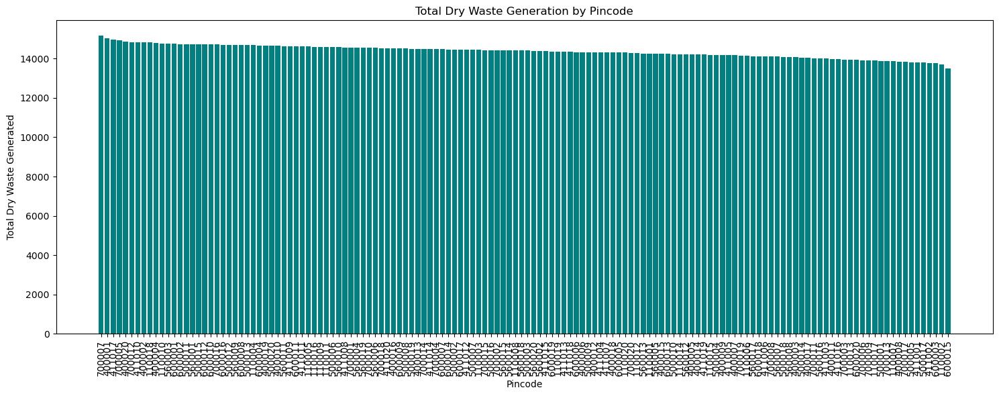

In [65]:
import matplotlib.pyplot as plt

# Optional: Limit to top 20 for better readability, remove if you want all
top_pincodes = pincode_agg  # Change or remove .head(20) to plot all

# Plot
plt.figure(figsize=(15, 6))
plt.bar(top_pincodes['Pincode'].astype(str), top_pincodes['Total_Waste'], color='teal')

# Labels and Title
plt.xlabel('Pincode')
plt.ylabel('Total Dry Waste Generated')
plt.title('Total Dry Waste Generation by Pincode')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [71]:
print(pincode_agg.shape)


(140, 2)


In [72]:
top_pincodes = pincode_agg.head(10)
print(top_pincodes)


     Pincode  Total_Waste
126   700007        15184
20    400001        15043
56    411017        14971
124   700005        14926
39    400020        14851
131   700012        14836
49    411010        14833
21    400002        14831
17    110018        14824
23    400004        14793


In [82]:


import pandas as pd

# Sum all months for each row
month_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]
waste_df['Total_Waste'] = waste_df[month_cols].sum(axis=1)

# First, drop duplicates to retain unique Pincode - City mapping
pincode_city = waste_df[['Pincode', 'City']].drop_duplicates()

# Group by Pincode and sum total waste
pincode_agg = waste_df.groupby('Pincode')['Total_Waste'].sum().reset_index()

# Merge with city info
final_df = pd.merge(pincode_agg, pincode_city, on='Pincode', how='left')

# Rearrange columns (optional)
final_df = final_df[['Pincode', 'City', 'Total_Waste']]

# Sort by total waste descending
final_df = final_df.sort_values(by='Total_Waste', ascending=False)

# Save to CSV
final_df.to_csv('total_waste_by_pincode.csv', index=False)

print(final_df.head())


     Pincode     City  Total_Waste
126   700007  Kolkata        15184
20    400001   Mumbai        15043
56    411017     Pune        14971
124   700005  Kolkata        14926
39    400020   Mumbai        14851


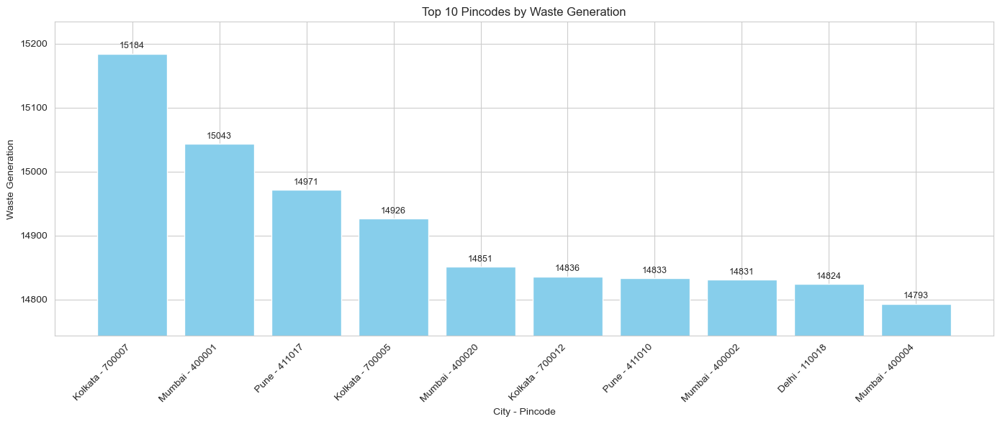

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('total_waste_by_pincode.csv')  # Replace with your actual file name

# Create combined label for x-axis
df['Label'] = df['City'].astype(str) + ' - ' + df['Pincode'].astype(str)

# Sort and select top 10 by Total Waste
top10 = df.sort_values(by='Total_Waste', ascending=False).head(10)

# Get min and max waste values to zoom in
min_val = top10['Total_Waste'].min()
max_val = top10['Total_Waste'].max()

# Plot
plt.figure(figsize=(14, 6))
bars = plt.bar(top10['Label'], top10['Total_Waste'], color='skyblue')

plt.xlabel('City - Pincode')
plt.ylabel('Waste Generation')
plt.title('Top 10 Pincodes by Waste Generation')
plt.xticks(rotation=45, ha='right')
plt.ylim(min_val - 50, max_val + 50)  # Zoom in Y-axis

# Add labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 5, f'{int(height)}',
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Your waste_df should already have these columns:
# 'Pincode', 'Total_Waste', 'Latitude', 'Longitude'

# Create base map centered on average coordinates
map_center = [waste_df['Latitude'].mean(), waste_df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Use MarkerCluster to avoid overlapping points
marker_cluster = MarkerCluster().add_to(m)

# Normalize waste values for radius scaling
max_waste = waste_df['Total_Waste'].max()

# Plot each pincode
for _, row in waste_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5 + (row['Total_Waste'] / max_waste) * 10,  # Scaled radius
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Pincode: {row['Pincode']}<br>Total Waste: {row['Total_Waste']}"
    ).add_to(marker_cluster)

# Save map to HTML
m.save('pincode_waste_map.html')


COORDINATES

In [100]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Step 1: Load your dataset (replace with your actual file name)


# Step 2: Clean column names (remove accidental spaces)
waste_df.columns = waste_df.columns.str.strip()

# Step 3: Sum all months to create 'Total_Waste' column
month_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]

waste_df['Total_Waste'] = waste_df[month_cols].sum(axis=1)

# Step 4: Create base map centered on average coordinates
map_center = [waste_df['Latitude'].mean(), waste_df['Longitude'].mean()]
waste_map = folium.Map(location=map_center, zoom_start=6)

# Step 5: Instantiate Marker Cluster
marker_cluster = MarkerCluster().add_to(waste_map)

# Step 6: Plot each coordinate with total waste in popup
max_waste = waste_df['Total_Waste'].max()

for _, row in waste_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4 + (row['Total_Waste'] / max_waste) * 10,  # Size based on waste amount
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Total Waste: {row['Total_Waste']}"
    ).add_to(marker_cluster)

# Step 7: Save the map to HTML
waste_map.save('waste_generation_map.html')
print("Map saved as 'waste_generation_map.html'")
waste_map


Map saved as 'waste_generation_map.html'


In [102]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Step 1: Load your dataset


# Step 2: Clean column names
waste_df.columns = waste_df.columns.str.strip()

# Step 3: Sum all months to create 'Total_Waste' column
month_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]

waste_df['Total_Waste'] = waste_df[month_cols].sum(axis=1)

# Step 4: Create base map centered on average coordinates
map_center = [waste_df['Latitude'].mean(), waste_df['Longitude'].mean()]
heat_map = folium.Map(location=map_center, zoom_start=6)

# Step 5: Prepare data for heatmap as list of [lat, lon, weight]
heat_data = waste_df[['Latitude', 'Longitude', 'Total_Waste']].values.tolist()

# Step 6: Add HeatMap layer
HeatMap(heat_data, radius=15, max_zoom=13, blur=10).add_to(heat_map)

# Step 7: Save map to HTML
heat_map.save('waste_generation_heatmap.html')
print("Heatmap saved as 'waste_generation_heatmap.html'")
HeatMap

Heatmap saved as 'waste_generation_heatmap.html'


folium.plugins.heat_map.HeatMap

In [105]:
import pandas as pd
import folium
from folium.plugins import HeatMap, MarkerCluster

# Step 1: Load your dataset


# Step 2: Clean column names
waste_df.columns = waste_df.columns.str.strip()

# Step 3: Sum all months to create 'Total_Waste' column
month_cols = [
    'April 2024', 'May 2024', 'June 2024', 'July 2024', 'August 2024', 'September 2024',
    'October 2024', 'November 2024', 'December 2024', 'January 2025', 'February 2025', 'March 2025'
]

waste_df['Total_Waste'] = waste_df[month_cols].sum(axis=1)

# Step 4: Create base map centered on average coordinates
map_center = [waste_df['Latitude'].mean(), waste_df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Step 5: Prepare data for HeatMap
heat_data = waste_df[['Latitude', 'Longitude', 'Total_Waste']].values.tolist()

# Step 6: Add HeatMap layer
HeatMap(heat_data, radius=15, max_zoom=13, blur=10).add_to(m)

# Step 7: Add Marker Cluster for individual locations
marker_cluster = MarkerCluster().add_to(m)

for _, row in waste_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5 + (row['Total_Waste'] / waste_df['Total_Waste'].max()) * 10,  # Scaled radius
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Total Waste: {row['Total_Waste']}"
    ).add_to(marker_cluster)

# Step 8: Save map to HTML
m.save('waste_generation_heatmap_and_markers.html')
print("Map saved as 'waste_generation_heatmap_and_markers.html'")
m

Map saved as 'waste_generation_heatmap_and_markers.html'


Participation percentage

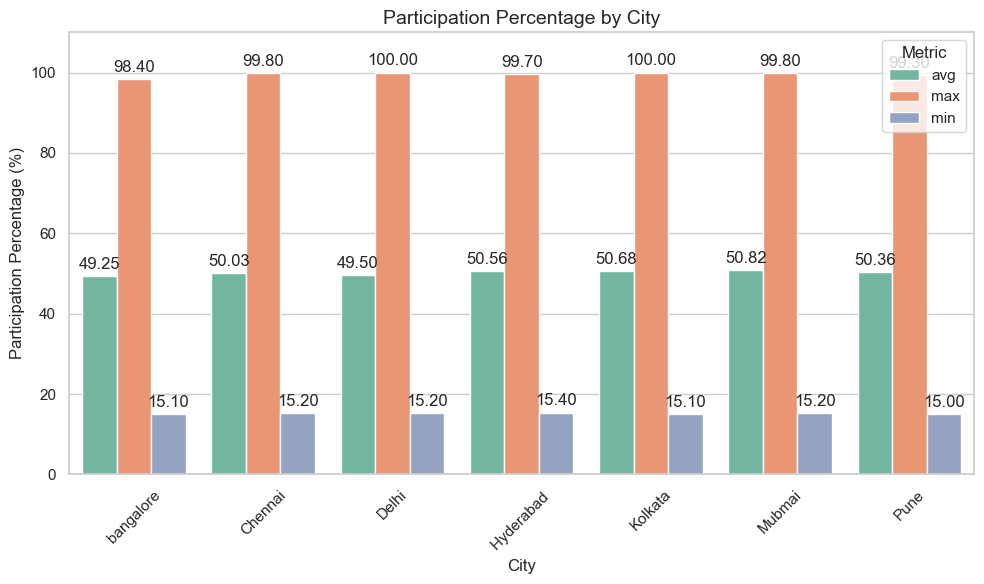

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df = pd.read_csv('participation_city.csv')  # Replace with your actual file name

# Set plot style
sns.set(style="whitegrid")

# Melt the dataframe to long format for easy plotting
df_melted = df.melt(id_vars='city', value_vars=['avg', 'max', 'min'],
                    var_name='Metric', value_name='Percentage')

# Create the barplot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df_melted, x='city', y='Percentage', hue='Metric', palette='Set2')

# Add labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3)

# Add labels and title
plt.title('Participation Percentage by City', fontsize=14)
plt.xlabel('City')
plt.ylabel('Participation Percentage (%)')
plt.xticks(rotation=45)
plt.ylim(0, 110)
plt.legend(title='Metric')

# Show plot
plt.tight_layout()
plt.show()


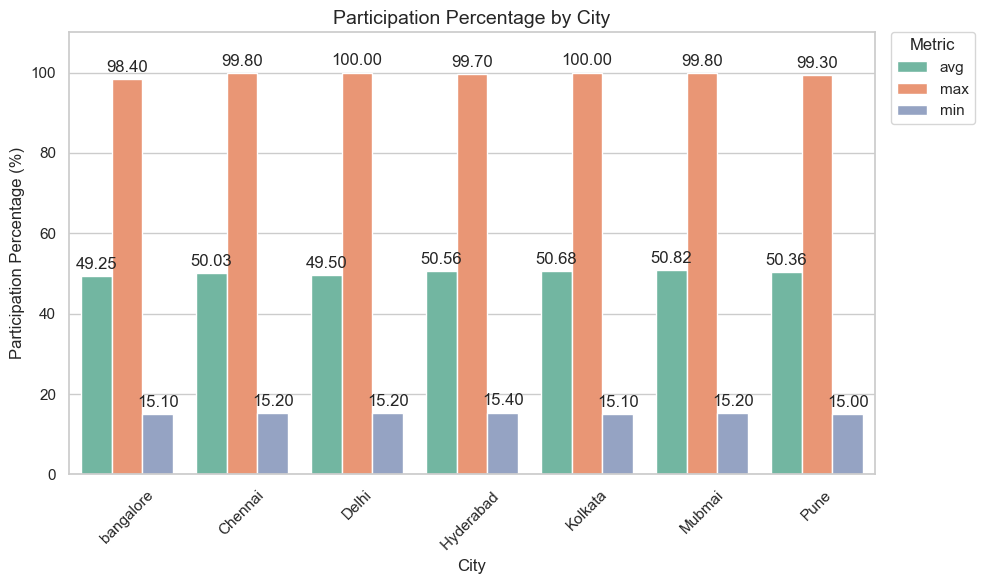

In [108]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df = pd.read_csv('participation_city.csv')  # Replace with your actual file name

# Set plot style
sns.set(style="whitegrid")

# Melt the dataframe to long format for easy plotting
df_melted = df.melt(id_vars='city', value_vars=['avg', 'max', 'min'],
                    var_name='Metric', value_name='Percentage')

# Create the barplot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df_melted, x='city', y='Percentage', hue='Metric', palette='Set2')

# Add labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3)

# Add labels and title
plt.title('Participation Percentage by City', fontsize=14)
plt.xlabel('City')
plt.ylabel('Participation Percentage (%)')
plt.xticks(rotation=45)
plt.ylim(0, 110)

# Move legend outside the plot
plt.legend(title='Metric', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Adjust layout to avoid cutoff
plt.tight_layout()

# Show plot
plt.show()


In [110]:
import pandas as pd
import folium
from geopy.geocoders import Nominatim

# Read your data
df = pd.read_csv('participation_city.csv')  # Replace with your file name

# Setup geolocator
geolocator = Nominatim(user_agent="city_locator")

# Function to get latitude and longitude
def get_coordinates(city):
    try:
        location = geolocator.geocode(city)
        return location.latitude, location.longitude
    except:
        return None, None

# Add latitude and longitude columns
df['lat'], df['lon'] = zip(*df['city'].apply(get_coordinates))

# Drop rows where location couldn't be found
df = df.dropna(subset=['lat', 'lon'])

# Initialize map centered on India
m = folium.Map(location=[22.9734, 78.6569], zoom_start=5)

# Add markers
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=row['avg'] / 5,  # Scale based on average participation
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=folium.Popup(f"""
        <b>City:</b> {row['city']}<br>
        <b>Avg Participation:</b> {row['avg']:.2f}%<br>
        <b>Max Participation:</b> {row['max']}%<br>
        <b>Min Participation:</b> {row['min']}%
        """, max_width=250)
    ).add_to(m)

# Save map to HTML
m.save('participation_map.html')
m

In [114]:
import pandas as pd

# Read your data
# Replace with your actual file
# Example:
# participation_df = pd.read_csv('your_data.csv')

# Group by pincode and calculate average, min, max
Pincode_summary = participation_df.groupby('Pincode')['Participation (%)'].agg(['mean', 'max', 'min']).reset_index()

# Rename columns for clarity
Pincode_summary.rename(columns={
    'mean': 'avg',
    'max': 'max',
    'min': 'min'
}, inplace=True)

# Save the table to a new file
Pincode_summary.to_csv('pincode_summary.csv', index=False)

# Display result
print(Pincode_summary)


     Pincode        avg   max   min
0     110001  45.850000  82.5  15.3
1     110002  45.900000  92.4  16.1
2     110003  51.733333  95.4  18.9
3     110004  51.396667  92.7  19.3
4     110005  49.503333  82.1  28.4
..       ...        ...   ...   ...
275   700036  51.593333  96.8  19.8
276   700037  49.756667  96.0  18.1
277   700038  46.656667  74.6  20.5
278   700039  47.540000  92.6  24.3
279   700040  50.706667  92.1  21.0

[280 rows x 4 columns]


In [116]:


import pandas as pd
import folium
from geopy.geocoders import Nominatim
from tqdm import tqdm  # Optional, for progress bar

# Read the pincode summary file
df = pd.read_csv('pincode_summary.csv')

# Setup geolocator
geolocator = Nominatim(user_agent="pincode_locator")

# Optional: progress bar for geocoding
tqdm.pandas()

# Function to get latitude and longitude for a pincode
def get_coordinates(pincode):
    try:
        location = geolocator.geocode({
            'postalcode': str(pincode),
            'country': 'India'
        })
        return location.latitude, location.longitude
    except:
        return None, None

# Get coordinates for each pincode
df['lat'], df['lon'] = zip(*df['Pincode'].progress_apply(get_coordinates))

# Drop rows where coordinates couldn't be found
df = df.dropna(subset=['lat', 'lon'])

# Initialize map centered on India
m = folium.Map(location=[22.9734, 78.6569], zoom_start=5)

# Add markers for each pincode
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=row['avg'] / 5,  # Scale marker size based on avg participation
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.6,
        popup=folium.Popup(f"""
        <b>Pincode:</b> {row['Pincode']}<br>
        <b>Avg Participation:</b> {row['avg']:.2f}%<br>
        <b>Max Participation:</b> {row['max']}%<br>
        <b>Min Participation:</b> {row['min']}%
        """, max_width=250)
    ).add_to(m)

# Save map to HTML
m.save('pincode_participation_map.html')

print("Map saved as 'pincode_participation_map.html'. Open this file in a browser to view.")
m

100%|██████████| 280/280 [06:36<00:00,  1.42s/it]


Map saved as 'pincode_participation_map.html'. Open this file in a browser to view.


In [ ]:

import folium

# Initialize map centered on India
m = folium.Map(location=[22.9734, 78.6569], zoom_start=5)

# Add markers for each coordinate
for _, row in participation_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=row['Participation (%)'] / 5,  # Scale marker size based on participation %
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.6,
        popup=folium.Popup(f"""
        <b>Participation %:</b> {row['Participation (%)']:.2f}%
        """, max_width=200)
    ).add_to(m)

# Show map (works in notebook or VSCode interactive window)
m


KeyError: 'avg'